1. Inital Setup

In [16]:
# Install OpenCV, pdf2image, poppler (for pdf to image), and pycocotools (MS COCO APIs)
# pip install opencv-python-headless
# pip install pdf2image
# pip install poppler-utils
# pip install pycocotools
# apt-get install tesseract-ocr

Retrieving notices: ...working... done
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: \ 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::opencv==3.3.1=py36h9248ab4_2
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::pyparsing==2.2.0=py36hee85983_1
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::kiwisolver==1.0.1=py36h764f252_0
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::tqdm==4.23.0=py36_0
  - defaults/linux-64::urllib3==1.25.7=py36_0
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::python==3.10.9=h7a1cb2a_2
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::pyqt==5.9.2=py36h751905a_0
  - pytorch/linux-64::pytorch==2.1.0=py3.10_cuda12.1_cudnn8.9.2_0
  - defaults/linux-64::certifi==2021.5.30=py310h06a4308_0
  - https://repo.continuum.io/pkg

In [174]:
# Imports
import zipfile
import os
from PIL import Image 
from pathlib import Path 
import shutil 
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pdf2image

In [169]:
# Checking versions (in case of dependency change)
# My system has conda 23.1.0 and python 3.10.9
!conda --version
!python --version
!nvidia-smi

conda 23.1.0
Python 3.10.9
Tue Dec 10 02:32:24 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000                On | 00000000:2F:00.0 Off |                  Off |
| 30%   36C    P8               20W / 300W|      6MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+----------------------------------------

In [170]:
# If you haven't already- extract any zip files (DeepRule, CornerNet, Scientific PDFs, etc.)
# Example of extracting files:
# zip_file = "/workspace/Documents/scientific_pdfs.zip"
# extract_to = "/workspace/Documents/scientific_pdfs"

# with zipfile.ZipFile(zip_file, 'r') as zip_ref:
#     zip_ref.extractall(extract_to)

# This will also be needed for CHARTEX data

2. Managing PDFs and Images

In [171]:
# Path to Scientific PDFS
# Customizable based on User input

#path = '/workspace/Documents/{your pdfs}'
path = '/workspace/Documents/scientific_pdfs/scientific_pdfs'

In [112]:
# Listing PDF files in folder
files = [f for f in os.listdir(path) if f.endswith('.pdf')]
print("PDF files:", files)

# If path is correct, names of 13 PDFS should display (for scientific_pdfs)
# Or however many are in your folder

PDF files: ['19161491.pdf', '20601430.pdf', 'nature11524.pdf', '20595258.pdf', '20006622.pdf', '26525112.pdf', '31710151.pdf', '11386378.pdf', '27965450.pdf', 'biochemj00498-0024.pdf', 'biochemj00515-0110.pdf', '12381735.pdf', '12775706.pdf']


In [172]:
# Inputting a specific PDF for chart/graph extraction
# Users can select whatever pdf they would like, I will be using one of the 13
# 20601430.pdf (A Glucose Transporter Can Mediate Ribose Uptake)
# Make sure all of these folders exist

# A couple of other pdfs are also being utilized as examples

# Utilized for DEMO:
# # Example 1:
# pdf_path = '/workspace/Documents/scientific_pdfs/scientific_pdfs/20601430.pdf'
# # Example 2:
# pdf_path2 = '/workspace/Documents/scientific_pdfs/scientific_pdfs/11386378.pdf'
# # Mistake Example 3:
# pdf_path3 = '/workspace/Documents/scientific_pdfs/scientific_pdfs/19161491.pdf'
# # Mistake Example 4:
# pdf_path4 = '/workspace/Documents/scientific_pdfs/scientific_pdfs/27965450.pdf'

In [156]:
# # Convert PDFs to images

# output_path = "/workspace/Documents/outputs"

# images = pdf2image.convert_from_path(pdf_path, dpi=300)
# for i, image in enumerate(images):
#     image_path = f"{output_path}/pdf_page_{i+1}.png"
#     image.save(image_path, "PNG")

In [157]:
# # Convert PDFs to images

# output_path = "/workspace/Documents/outputs2"

# images = pdf2image.convert_from_path(pdf_path2, dpi=300)
# for i, image in enumerate(images):
#     image_path = f"{output_path}/pdf_page_{i+1}.png"
#     image.save(image_path, "PNG")

In [158]:
# # Convert PDFs to images

# output_path = "/workspace/Documents/outputs3"

# images = pdf2image.convert_from_path(pdf_path3, dpi=300)
# for i, image in enumerate(images):
#     image_path = f"{output_path}/pdf_page_{i+1}.png"
#     image.save(image_path, "PNG")

In [159]:
# # Convert PDFs to images

# output_path = "/workspace/Documents/outputs4"

# images = pdf2image.convert_from_path(pdf_path4, dpi=300)
# for i, image in enumerate(images):
#     image_path = f"{output_path}/pdf_page_{i+1}.png"
#     image.save(image_path, "PNG")

In [160]:
# #Adaptable to user folder

# input_path = "/workspace/Documents/outputs"
# input_path2 = "/workspace/Documents/outputs2"
# input_path3 = "/workspace/Documents/outputs3"
# input_path4 = "/workspace/Documents/outputs4"

In [176]:
# Generalized for Users

# This generates folders {pdf}_images where the images will be stored.

def pdf_to_images(pdf_path, base_output_dir, dpi=300):
    #directory exists and naming
    pdf_stem = Path(pdf_path).stem  # so "20601430" grabbed from "20601430.pdf"
    output_dir = Path(base_output_dir) / f"{pdf_stem}_images"
    output_dir.mkdir(parents=True, exist_ok=True)

    #PDF -> Image
    images = pdf2image.convert_from_path(pdf_path, dpi=dpi)
    for i, image in enumerate(images):
        image_name = f"pdf_page_{i+1}.png"
        image_path = output_dir / image_name
        image.save(image_path, "PNG")
    print(f"Converted {pdf_path} to images in {output_dir}")

# Adjust to your path
pdf_files = [
    '/workspace/Documents/scientific_pdfs/scientific_pdfs/20601430.pdf',
    '/workspace/Documents/scientific_pdfs/scientific_pdfs/11386378.pdf',
    '/workspace/Documents/scientific_pdfs/scientific_pdfs/19161491.pdf',
    '/workspace/Documents/scientific_pdfs/scientific_pdfs/27965450.pdf'
]

# directory (customizable)
base_output_dir = "/workspace/Documents"

# PDF->Image loop
for pdf_file in pdf_files:
    pdf_to_images(pdf_file, base_output_dir)


Converted /workspace/Documents/scientific_pdfs/scientific_pdfs/20601430.pdf to images in /workspace/Documents/20601430_images
Converted /workspace/Documents/scientific_pdfs/scientific_pdfs/11386378.pdf to images in /workspace/Documents/11386378_images
Converted /workspace/Documents/scientific_pdfs/scientific_pdfs/19161491.pdf to images in /workspace/Documents/19161491_images
Converted /workspace/Documents/scientific_pdfs/scientific_pdfs/27965450.pdf to images in /workspace/Documents/27965450_images


3. OpenCV Refinements

In [179]:
# Failed Strategies used LayoutLMv2 and YOLOv5 are available in previous
# versions of the jupyter notebook in GitHub.

# This chunk of code is to reflect all of the different iterations of the OpenCV model
# that I implemented
# Mostly to show the work and different strategies I used:

#First try:

# for image_path in Path(output_folder).glob("*.png"):
#     #read image in grayscale
#     image = cv2.imread(str(image_path))
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#     #adaptive thresholding (highlights chart areas)
#     thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
#                                    cv2.THRESH_BINARY_INV, 11, 2)

#     #canny edge detection
#     edges = cv2.Canny(thresh, 100, 200)

#     #find contours
#     contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     #track if detections are made
#     detections_made = False
#     detected_region_counter = 0  #for cropped image naming

#     #iteration through contours and filtering based on area and aspect ratio
#     for contour in contours:
#         min_area = 1000  #min area threshold for chart
#         if cv2.contourArea(contour) > min_area:
#             x, y, w, h = cv2.boundingRect(contour)

#             #filter based on aspect ratio (if needed)
#             aspect_ratio = w / float(h)
#             if 0.5 < aspect_ratio < 2.0:  #adjust aspect ratio range
#                 #mark if there was a detection
#                 detections_made = True

#                 #drawing bounding box on image
#                 cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    #             #crop detected chart
    #             cropped_region = image[y:y+h, x:x+w]
    #             cropped_image_path = Path(cropped_charts_folder) / f"{image_path.stem}_chart_{detected_region_counter}.png"
    #             cv2.imwrite(str(cropped_image_path), cropped_region)
    #             detected_region_counter += 1

    # #save and display (only there was a detection)
    # if detections_made:
    #     #save annotated image to folder
    #     annotated_image_path = Path(detected_charts_folder) / f"annotated_{image_path.name}"
    #     cv2.imwrite(str(annotated_image_path), image)

    #     #display annotated image
    #     plt.figure(figsize=(8, 8))
    #     plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  #converting to RGB for matplotlib display
    #     plt.title(f"Detected charts in {image_path.name}")
    #     plt.axis("off")
    #     plt.show()
    # else:
    #     print(f"No charts detected in {image_path.name}, skipping.")

# I ran this code 3 times and it was consistent all 3 times

# From this initial run of OpenCV we can see that it detects 35 charts/graphs from this scientific publication.

# To calculate this accuracy we will use a similar method than before, except manually count the number of charts that actually exist

# Page 3 has 3 graphs
# Page 4 has 2 (readable) charts
# Page 5 has 4 (readable) charts
# Page 6 has 2 charts

# Thus a total of 11 charts and graphs in this particular pdf (20601430.pdf)

# Our model detected 35 of these charts, but let's calculate a very simple accuracy of these detections:

# 8 (true detections) / 11 (total) = 72.7% accuracy

# This is definitely an accuracy we can work with, the issue is to fine tune the model to

# a. recognize graphs as well and

# b. stop detecting letters as figures

# To graph and tackle (b), I've raised the min area threshold to 3000 and then added a circularity check to attempt to sort out those small o's and 0's that the model is recognizing as charts

# for img_path in Path(output_folder).glob("*.png"):
#     #read image in grayscale (same)
#     img = cv2.imread(str(img_path))
#     gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#     #adaptive thresholding (highlights chart areas)
#     thresh_img = cv2.adaptiveThreshold(
#         gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
#     )

#     #canny edge detection (same)
#     edge_img = cv2.Canny(thresh_img, 100, 200)

#     #find contours
#     cnts, _ = cv2.findContours(edge_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     #track if detections are made
#     found_chart = False
#     chart_count = 0

#     #iteration through contours and filtering based on area and aspect ratio
#     for c in cnts:
#         min_area = 3000  #increased min area threshold
#         if cv2.contourArea(c) > min_area:
#             x, y, w, h = cv2.boundingRect(c)

#             #filter based on aspect ratio (if needed)
#             ratio = w / float(h)
#             if 0.5 < ratio < 2.5:

#                 #checking for circle images
#                 perimeter = cv2.arcLength(c, True)
    #             area = cv2.contourArea(c)
    #             circularity = 4 * 3.14159 * (area / (perimeter * perimeter)) if perimeter != 0 else 0
    #             if circularity > 0.6:  #circular shapes have a higher circularity
    #                 continue  #skip this contour if it is likely circular

    #             found_chart = True  #mark detection made

    #             #drawing bounding box on image
    #             cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    #             #crop detected chart
    #             cropped_img = img[y:y+h, x:x+w]
    #             crop_path = Path(cropped_charts_folder) / f"{img_path.stem}_chart_{chart_count}.png"
    #             cv2.imwrite(str(crop_path), cropped_img)
    #             chart_count += 1

    # #save and display (only there was a detection)
    # if found_chart:
    #     anno_path = Path(detected_charts_folder) / f"annotated_{img_path.name}"
    #     cv2.imwrite(str(anno_path), img)

    #     #display annotated image
    #     plt.figure(figsize=(8, 8))
    #     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #     plt.title(f"Detected charts in {img_path.name}")
    #     plt.axis("off")
    #     plt.show()
    # else:
    #     print(f"No charts detected in {img_path.name}, skipping.")

# Now the model is not able to recognize ANY charts/graphs. FAIL

# for img_path in Path(output_folder).glob("*.png"):
#     #read image in grayscale (same)
#     img = cv2.imread(str(img_path))
#     gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#     #adaptive thresholding (highlights chart areas)
#     thresh_img = cv2.adaptiveThreshold(
#         gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
#     )

#     #canny edge detection (same)
#     edge_img = cv2.Canny(thresh_img, 100, 200)

#     #find contours
#     cnts, _ = cv2.findContours(edge_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     #track if detections are made
#     detected_areas = []
#     found_chart = False
#     chart_count = 0

#     #iteration through contours and filtering based on area and aspect ratio
#     for c in cnts:
#         area = cv2.contourArea(c)
#         min_area = 1000  #min area threshold

#         if area > min_area:
#             x, y, w, h = cv2.boundingRect(c)
#             aspect_ratio = w / float(h)

    #         #filter based on aspect ratio
    #         if 0.5 < aspect_ratio < 2.0:
    #             #save bounding box and area
    #             detected_areas.append((area, x, y, w, h))

    # #calculate average area to filter through
    # if detected_areas:
    #     avg_area = sum([a[0] for a in detected_areas]) / len(detected_areas)
    #     refined_min_area = avg_area * 0.3  #set minimum area to 30% of average

    #     #filter contours by refined area and draw bounding boxes
    #     for area, x, y, w, h in detected_areas:
    #         if area >= refined_min_area:
    #             found_chart = True  #confirm chart detection

    #             #drawing bounding box on image
    #             cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    #             #crop detected chart
    #             cropped_img = img[y:y+h, x:x+w]
    #             crop_path = Path(cropped_charts_folder) / f"{img_path.stem}_chart_{chart_count}.png"
    #             cv2.imwrite(str(crop_path), cropped_img)
    #             chart_count += 1

    # #save and display (only there was a detection)
    # if found_chart:
    #     anno_path = Path(detected_charts_folder) / f"annotated_{img_path.name}"
    #     cv2.imwrite(str(anno_path), img)

    #     #display annotated image
    #     plt.figure(figsize=(8, 8))
    #     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #     plt.title(f"Detected charts in {img_path.name}")
    #     plt.axis("off")
    #     plt.show()
    # else:
        # print(f"No charts detected in {img_path.name}, skipping.")

# Accuracy goes up when we refine it this way. It is NOT filtering out noise though still. I'm thinking about using image size or file size as a method to filter out noise as it is practically impossible for a figure to be that small.

# I'm going to work on a new strategy to be able to extract the data:

# Increase Min Area Threshold: I'm going to set it to 2000 to help eliminate those very small objects like letters

# Circularity: I'll filter out circular objects (like o's and 0's)

# Width-Height Ratio: charts are usually rectangular or non-square so I'll try filtering out square-like objects

# Density: I'll measure contour density to help elimiate thin or scattered objects

# Contour Shape Check (Hull vs. Area): comparing countour area and its convex hull area might help detect shape irregularity (like letters)

# for img_path in Path(output_folder).glob("*.png"):
#     #reads image file and loads it into OpenCV compatible format (multidimentional array)
#     img = cv2.imread(str(img_path))
#     #converts color image to grayscale (reducing to one intensity channel (brightness))
#     #this simplifies processing
#     gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#     #converts grayscale image to binary (black&white) based on calculated threshold
#     #gray_img: image
#     #255: max val assigned to pixels (that meet threshold condition)
#     #cv2.ADAPTIVE_THRESH_GAUSSIAN_C: sets the method to gaussian, each pixel threshold
#     #is computed based on nearby pixels
#     #cv2.THRESH_BINARY_INV: inverts binary image, setting pizels to below
#     #threshold 255 (white) and above 0 (black)
#     # 11 + 2: 11 is the block size or area of neighboring pixels
#     # 2 is a constant subtracted from mean to fine-tune the threshold
#     thresh_img = cv2.adaptiveThreshold(
#         gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
#     )

#     #canny edge detection
#     #cv2.Canny: detects edges in binary image using canny algorithm
#     #100 + 200: the lower and upper thresholds for edge detection
#     #pixels with gradients about 200 are edges and below 100 is ignored
#     edge_img = cv2.Canny(thresh_img, 100, 200)

#     #finding contours
#     #cv2.findContours: finds contours (outlines of shapes) in image
#     #cv2.RETR_EXTERNAL: retrieves only outer contours (we ignored nested)
#     #cv2.CHAIN_APPROX_SIMPLE: simplifies the contours to reduce points and storage
#     #cnts: stores list of detected contours as array of points
#     cnts, _ = cv2.findContours(edge_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     #track detections and initialize counter for the cropped images
#     found_chart = False
#     chart_count = 0

    # #filter contours (using our five techniques)
    # #loops over each detected contour in cnts
    # #cv2.contourArea(c): calculates the area of contour c.
    # #cv2.arcLength(c, True): calculates perimeter of contour c (True = contour is closed)
    # for c in cnts:
    #     area = cv2.contourArea(c)
    #     perimeter = cv2.arcLength(c, True)

    #     #1: min area threshold (might can adjust based on image size)
    #     if area < 2000:
    #         continue

    #     #bounding boxes
    #     #cv2.boundingRect(c): creates bounding rect. for contour c
    #     #returns the top-left corner coordinates (x,y) and width and height
    #     #(for further checks)
    #     x, y, w, h = cv2.boundingRect(c)

    #     #2: aspect ratio check (non-rectangular objects)
    #     #filters out contours that are too narrow or tall
    #     aspect_ratio = w / float(h)
    #     if not (0.5 < aspect_ratio < 2.5):  #can be adjust based on chart dimensions
    #         continue

    #     #3: circularity check (filter circular/small shapes)
    #     #circularity: 4 * (pi) * area/(perimeter^2)
    #     #circularity close to 1 is circular
    #     circularity = 4 * 3.14159 * (area / (perimeter * perimeter)) if perimeter != 0 else 0
    #     if circularity > 0.8:
    #         continue

        # #4: density (filter thin or sparse contours)
        # #density: area / (w * h) where lower density is thin or sparse
        # density = area / (w * h)
        # if density < 0.4:
        #     continue

        # #5: shape (convex hull comparison)
        # #cv2.convexHull(c): calculates convex hull of contour c,
        # #this is the smaller convex shape that encloses it
        # #solidity: area / hull_area where lower values are irregular
        # hull = cv2.convexHull(c)
        # hull_area = cv2.contourArea(hull)
        # solidity = area / hull_area if hull_area != 0 else 0
        # if solidity < 0.7:
        #     continue

        # #if all checks are passed
        # found_chart = True

        # #cv2.rectangle() draws a green rect around chart area
        # cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # #crop region and save
        # #extracts chart region using bounding box coords (x,y,w,h)
        # cropped_img = img[y:y+h, x:x+w]
        # crop_path = Path(cropped_charts_folder) / f"{img_path.stem}_chart_{chart_count}.png"
        # cv2.imwrite(str(crop_path), cropped_img)
        # chart_count += 1

    # #save and display (just to visualize without going into folder)
    # if found_chart:
    #     anno_path = Path(detected_charts_folder) / f"annotated_{img_path.name}"
    #     cv2.imwrite(str(anno_path), img)

    #     #display
    #     plt.figure(figsize=(8, 8))
    #     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #     plt.title(f"Detected charts in {img_path.name}")
    #     plt.axis("off")
    #     plt.show()
    # else:
    #     print(f"No charts detected in {img_path.name}, skipping.")

# The accuracy of this new model is 8/11 or about 73% with 3 false detections.

# New challenges:

# Still does not detect graphs (might can get code)
# Some letters are still detected (specifically B's)
# Due to filter out circles and squares, charts from other pdfs may not work well with this refined model

# Now, let's tackle the graph recognition.

# import cv2
# from matplotlib import pyplot as plt
# from pathlib import Path
# import math
# import numpy as np


# for img_path in Path(output_folder).glob("*.png"):
#     #grayscale
#     img = cv2.imread(str(img_path))
#     gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # #adaptive thresholding
    # thresh_img = cv2.adaptiveThreshold(
    #     gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    # )

    # #canny edge detection with slightly higher thresholds
    # edge_img = cv2.Canny(thresh_img, 100, 200)

    # #gough Line Transform to detect longer, prominent lines
    # lines = cv2.HoughLinesP(edge_img, 1, math.pi / 180, threshold=80, minLineLength=50, maxLineGap=10)

    # if lines is None:
    #     print(f"No line graphs detected in {img_path.name}, skipping.")
    #     continue

    # #filter lines based on angles and create an empty canvas for selected lines
    # line_canvas = np.zeros_like(img)
    # line_angles = []
    # for line in lines:
    #     x1, y1, x2, y2 = line[0]
    #     angle = math.degrees(math.atan2(y2 - y1, x2 - x1))
    #     if 20 < abs(angle) < 160:  #filter out near-horizontal or near-vertical lines
    #         line_angles.append(angle)
    #         cv2.line(line_canvas, (x1, y1), (x2, y2), (255, 255, 255), 1)

    # #use a sliding window to detect regions with a high density of line segments
    # window_size = (150, 150)  #larger window size to avoid text regions
    # step_size = 75
    # found_chart = False
    # chart_count = 0

    # for y in range(0, line_canvas.shape[0] - window_size[1], step_size):
    #     for x in range(0, line_canvas.shape[1] - window_size[0], step_size):
    #         window = line_canvas[y:y + window_size[1], x:x + window_size[0]]
    #         line_density = cv2.countNonZero(cv2.cvtColor(window, cv2.COLOR_BGR2GRAY))

    #         #threshold based on line density to filter out noise
    #         if line_density > 100:  #adjusting this as needed
    #             found_chart = True

    #             #bounding box
    #             cv2.rectangle(img, (x, y), (x + window_size[0], y + window_size[1]), (0, 255, 0), 2)

    #             #crop the detected region
    #             cropped_img = img[y:y + window_size[1], x:x + window_size[0]]
    #             crop_path = Path(cropped_charts_folder) / f"{img_path.stem}_linegraph_{chart_count}.png"
    #             cv2.imwrite(str(crop_path), cropped_img)
    #             chart_count += 1

    # #save and display
    # if found_chart:
    #     anno_path = Path(detected_charts_folder) / f"annotated_{img_path.name}"
    #     cv2.imwrite(str(anno_path), img)

    #     #display
    #     plt.figure(figsize=(8, 8))
    #     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #     plt.title(f"Detected line graph in {img_path.name}")
    #     plt.axis("off")
    #     plt.show()
    # else:
    #     print(f"No line graphs detected in {img_path.name}, skipping.")

# the detected regions are too small, but the model is not detecting those regions with the line graphs

In [180]:
# # First refined attempt at extracting charts and graphs
# # Basically a glorified box detector! But there was lot of effort put in

# for img_path in Path(output_path).glob("*.png"):
#     #reads image file and loads it into OpenCV compatible format (multidimentional array)
#     img = cv2.imread(str(img_path))
#     #converts color image to grayscale (reducing to one intensity channel (brightness))
#     #this simplifies processing
#     gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#     #converts grayscale image to binary (black&white) based on calculated threshold
#     #gray_img: image
#     #255: max val assigned to pixels (that meet threshold condition)
#     #cv2.ADAPTIVE_THRESH_GAUSSIAN_C: sets the method to gaussian, each pixel threshold
#     #is computed based on nearby pixels
#     #cv2.THRESH_BINARY_INV: inverts binary image, setting pizels to below
#     #threshold 255 (white) and above 0 (black)
#     # 11 + 2: 11 is the block size or area of neighboring pixels
#     # 2 is a constant subtracted from mean to fine-tune the threshold
#     thresh_img = cv2.adaptiveThreshold(
#         gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
#     )

#     #canny edge detection
#     #cv2.Canny: detects edges in binary image using canny algorithm
#     #100 + 200: the lower and upper thresholds for edge detection
#     #pixels with gradients about 200 are edges and below 100 is ignored
#     edge_img = cv2.Canny(thresh_img, 100, 200)

#     #finding contours
#     #cv2.findContours: finds contours (outlines of shapes) in image
#     #cv2.RETR_EXTERNAL: retrieves only outer contours (we ignored nested)
#     #cv2.CHAIN_APPROX_SIMPLE: simplifies the contours to reduce points and storage
#     #cnts: stores list of detected contours as array of points
#     cnts, _ = cv2.findContours(edge_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     #track detections and initialize counter for the cropped images
#     found_chart = False
#     chart_count = 0

#     #filter contours (using our five techniques)
#     #loops over each detected contour in cnts
#     #cv2.contourArea(c): calculates the area of contour c.
#     #cv2.arcLength(c, True): calculates perimeter of contour c (True = contour is closed)
#     for c in cnts:
#         area = cv2.contourArea(c)
#         perimeter = cv2.arcLength(c, True)

#         #1: min area threshold (might can adjust based on image size)
#         if area < 2000:
#             continue

#         #bounding boxes
#         #cv2.boundingRect(c): creates bounding rect. for contour c
#         #returns the top-left corner coordinates (x,y) and width and height
#         #(for further checks)
#         x, y, w, h = cv2.boundingRect(c)

#         #2: aspect ratio check (non-rectangular objects)
#         #filters out contours that are too narrow or tall
#         aspect_ratio = w / float(h)
#         if not (0.5 < aspect_ratio < 2.5):  #can be adjust based on chart dimensions
#             continue

#         #3: circularity check (filter circular/small shapes)
#         #circularity: 4 * (pi) * area/(perimeter^2)
#         #circularity close to 1 is circular
#         circularity = 4 * 3.14159 * (area / (perimeter * perimeter)) if perimeter != 0 else 0
#         if circularity > 0.8:
#             continue

#         #4: density (filter thin or sparse contours)
#         #density: area / (w * h) where lower density is thin or sparse
#         density = area / (w * h)
#         if density < 0.4:
#             continue

#         #5: shape (convex hull comparison)
#         #cv2.convexHull(c): calculates convex hull of contour c,
#         #this is the smaller convex shape that encloses it
#         #solidity: area / hull_area where lower values are irregular
#         hull = cv2.convexHull(c)
#         hull_area = cv2.contourArea(hull)
#         solidity = area / hull_area if hull_area != 0 else 0
#         if solidity < 0.7:
#             continue

#         #if all checks are passed
#         found_chart = True

#         #cv2.rectangle() draws a green rect around chart area
#         cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

#         #crop region and save
#         #extracts chart region using bounding box coords (x,y,w,h)
#         cropped_img = img[y:y+h, x:x+w]
#         crop_path = Path(cropped_path) / f"{img_path.stem}_chart_{chart_count}.png"
#         cv2.imwrite(str(crop_path), cropped_img)
#         chart_count += 1

#     #save and display (just to visualize without going into folder)
#     if found_chart:
#         anno_path = Path(detected_path) / f"annotated_{img_path.name}"
#         cv2.imwrite(str(anno_path), img)

#         #display
#         plt.figure(figsize=(8, 8))
#         plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#         plt.title(f"Detected charts in {img_path.name}")
#         plt.axis("off")
#         plt.show()
#     else:
#         print(f"No charts detected in {img_path.name}, skipping.")


Processing pdf_page_9.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_9_figure.png


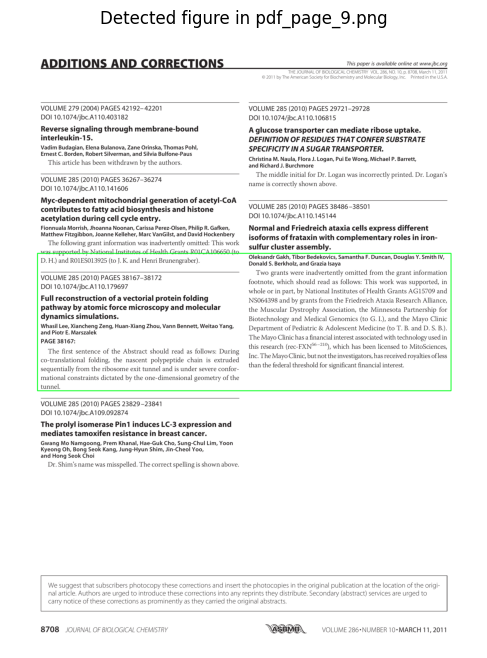

Processing pdf_page_2.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_2_figure.png


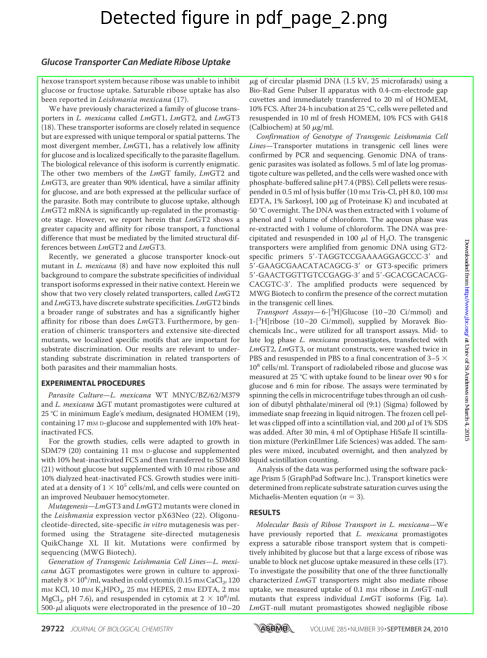

Processing pdf_page_3.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_3_figure.png


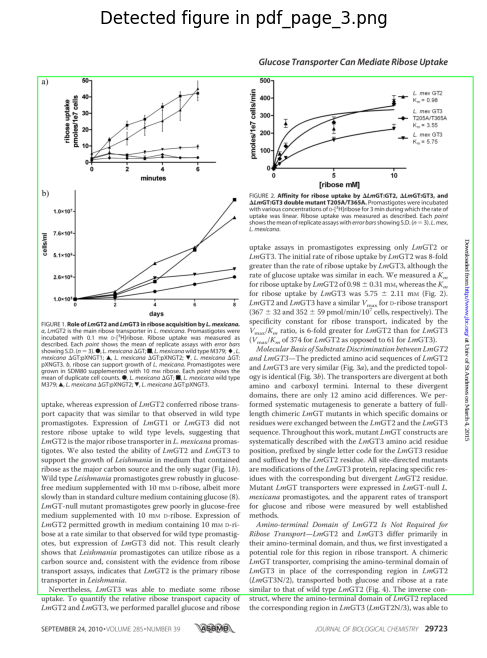

Processing pdf_page_6.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_6_figure.png


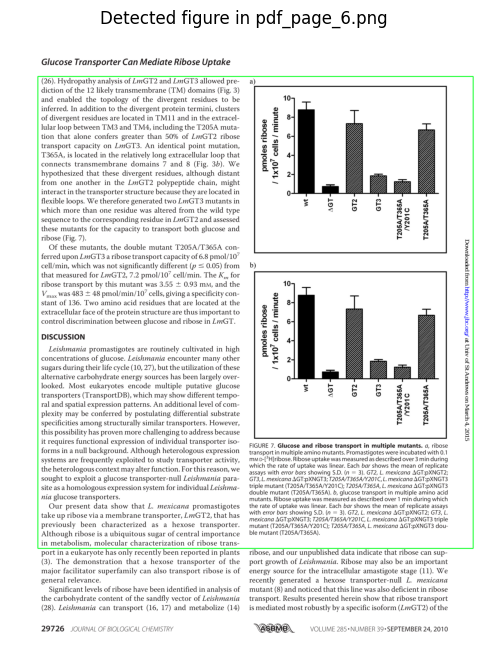

Processing pdf_page_7.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_7_figure.png


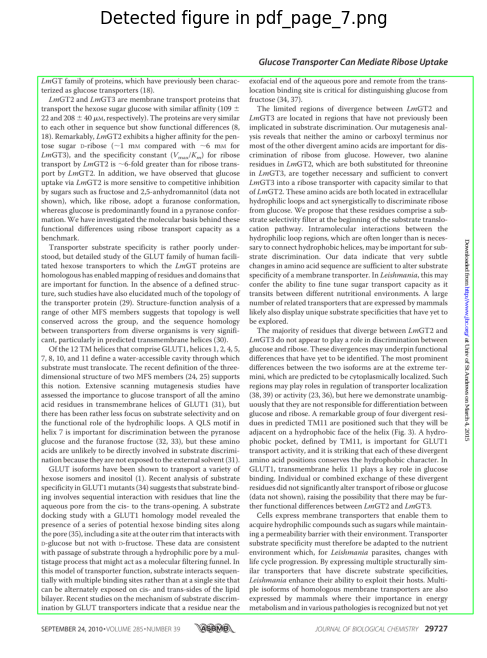

Processing pdf_page_5.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_5_figure.png


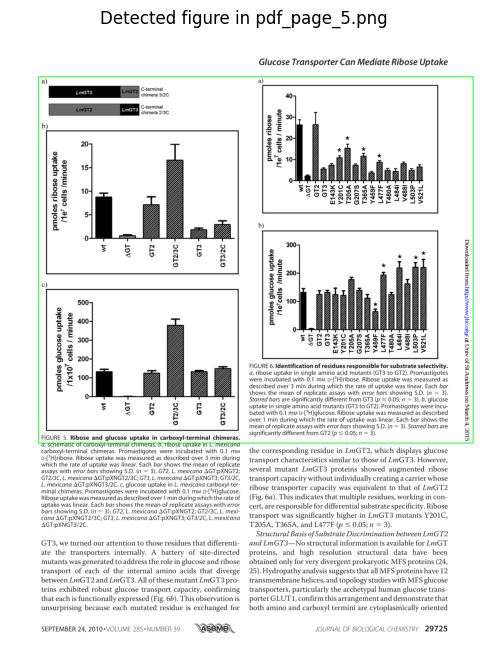

Processing pdf_page_8.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_8_figure.png


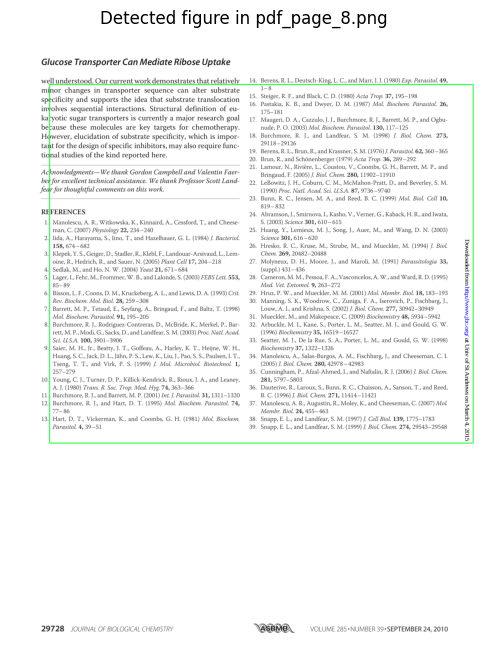

Processing pdf_page_10.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_10_figure.png


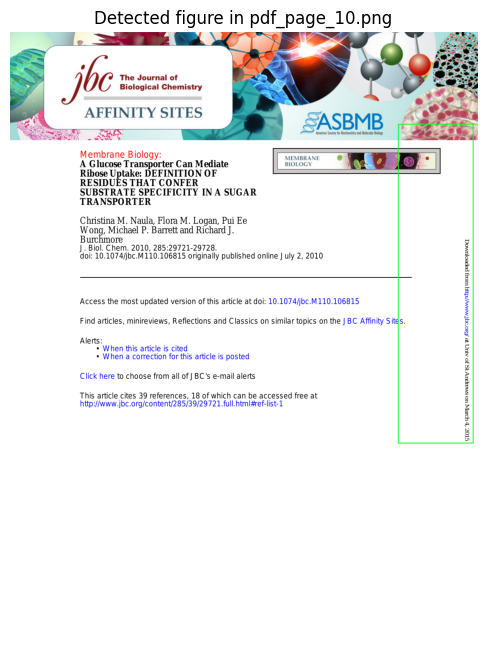

Processing pdf_page_4.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_4_figure.png


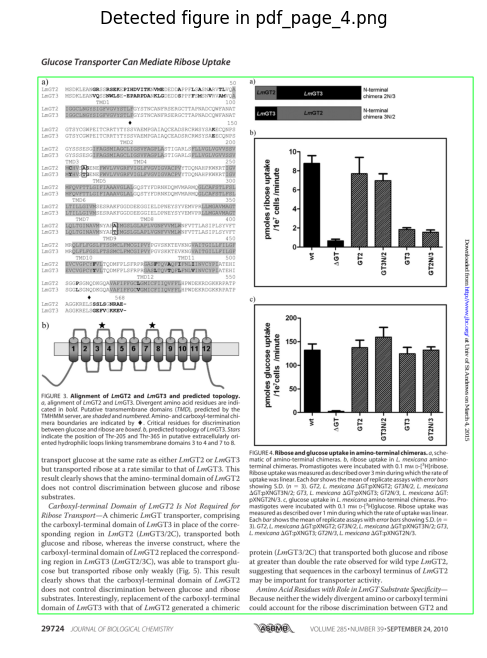

Processing pdf_page_1.png...
Saved extracted figure to /workspace/Documents/extracted_figures/pdf_page_1_figure.png


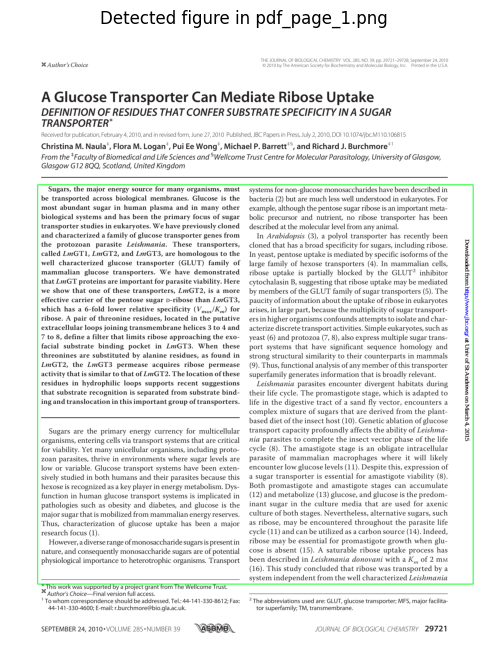

In [110]:
# # New Strategy - First Pass
# output_path = "/workspace/Documents/extractions_strat1"

# #looping through image in the path
# for img_path in Path(input_path).glob("*.png"):
#     print(f"Processing {img_path.name}...")
    
#     #load image, convert grayscale, apply Otsu's
#     img = cv2.imread(str(img_path))
#     original = img.copy()
#     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
#     #dilate to connect text contours into single
#     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 10))
#     dilate = cv2.dilate(thresh, kernel, iterations=2)
    
#     #find + remove non-diagram contours
#     contours = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#     contours = contours[0] if len(contours) == 2 else contours[1]
#     for c in contours:
#         x, y, w, h = cv2.boundingRect(c)
#         area = cv2.contourArea(c)
#         # Filter non-diagram contours based on aspect ratio and area
#         if w / h > 2 and area > 10000:
#             cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
#     #detect contours that passed + bounding boxes
#     diagram_boxes = []
#     contours = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#     contours = contours[0] if len(contours) == 2 else contours[1]
#     for c in contours:
#         x, y, w, h = cv2.boundingRect(c)
#         diagram_boxes.append([x, y, x + w, y + h])
    
#     #form single bounding box around all diagram contours (MISTAKE!)
#     if diagram_boxes:
#         diagram_boxes = np.asarray(diagram_boxes)
#         x = np.min(diagram_boxes[:, 0])
#         y = np.min(diagram_boxes[:, 1])
#         w = np.max(diagram_boxes[:, 2]) - x
#         h = np.max(diagram_boxes[:, 3]) - y
        
#         #draw bounding box
#         cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
        
#         #extract roi
#         ROI = original[y:y+h, x:x+w]
        
#         #save
#         output_file = Path(output_path) / f"{img_path.stem}_figure.png"
#         cv2.imwrite(str(output_file), ROI)
#         print(f"Saved extracted figure to {output_file}")
        
#         #display
#         plt.figure(figsize=(8, 8))
#         plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#         plt.title(f"Detected figure in {img_path.name}")
#         plt.axis("off")
#         plt.show()
#     else:
#         print(f"No diagrams detected in {img_path.name}, skipping.")


Processing 31710151_page_6.png...
Saved chart 1 from 31710151_page_6.png to /workspace/Documents/extracted_figures_3/31710151_page_6_chart_0.png
Saved chart 2 from 31710151_page_6.png to /workspace/Documents/extracted_figures_3/31710151_page_6_chart_1.png
Saved chart 3 from 31710151_page_6.png to /workspace/Documents/extracted_figures_3/31710151_page_6_chart_2.png
Saved chart 4 from 31710151_page_6.png to /workspace/Documents/extracted_figures_3/31710151_page_6_chart_3.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_6.png


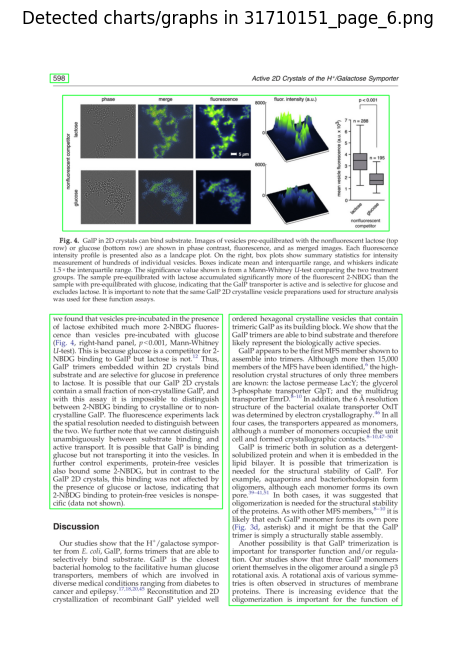

Processing 31710151_page_2.png...
Saved chart 1 from 31710151_page_2.png to /workspace/Documents/extracted_figures_3/31710151_page_2_chart_0.png
Saved chart 2 from 31710151_page_2.png to /workspace/Documents/extracted_figures_3/31710151_page_2_chart_1.png
Saved chart 3 from 31710151_page_2.png to /workspace/Documents/extracted_figures_3/31710151_page_2_chart_2.png
Saved chart 4 from 31710151_page_2.png to /workspace/Documents/extracted_figures_3/31710151_page_2_chart_3.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_2.png


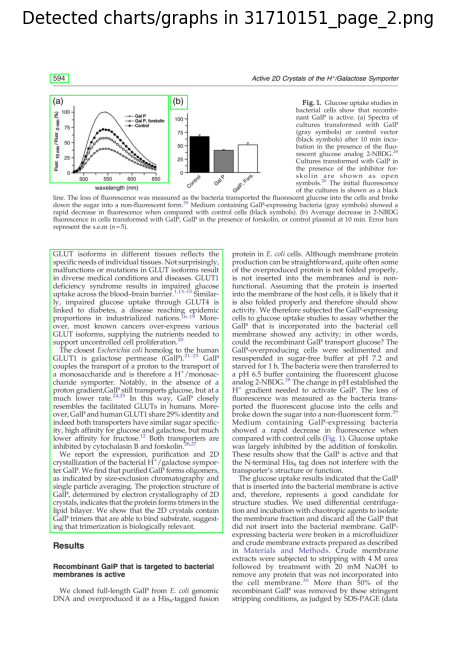

Processing 31710151_page_8.png...
Saved chart 1 from 31710151_page_8.png to /workspace/Documents/extracted_figures_3/31710151_page_8_chart_0.png
Saved chart 2 from 31710151_page_8.png to /workspace/Documents/extracted_figures_3/31710151_page_8_chart_1.png
Saved chart 3 from 31710151_page_8.png to /workspace/Documents/extracted_figures_3/31710151_page_8_chart_2.png
Saved chart 4 from 31710151_page_8.png to /workspace/Documents/extracted_figures_3/31710151_page_8_chart_3.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_8.png


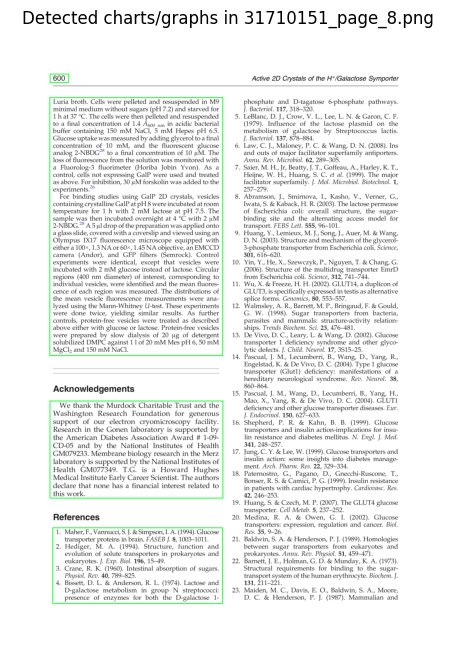

Processing 31710151_page_9.png...
Saved chart 1 from 31710151_page_9.png to /workspace/Documents/extracted_figures_3/31710151_page_9_chart_0.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_9.png


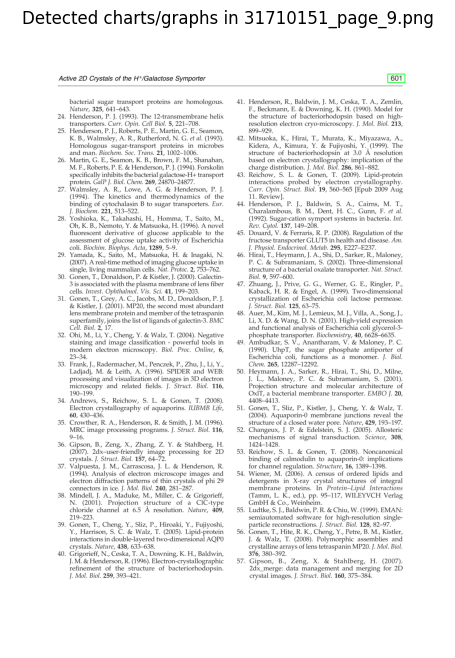

Processing 31710151_page_5.png...
Saved chart 1 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_0.png
Saved chart 2 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_1.png
Saved chart 3 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_2.png
Saved chart 4 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_3.png
Saved chart 5 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_4.png
Saved chart 6 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_5.png
Saved chart 7 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_6.png
Saved chart 8 from 31710151_page_5.png to /workspace/Documents/extracted_figures_3/31710151_page_5_chart_7.png
Saved chart 9 from 31710151_page_5.png to /workspace/Documents/extracted_figur

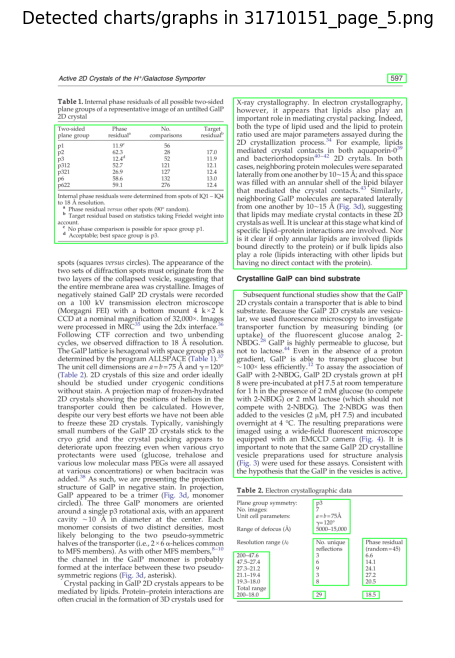

Processing 31710151_page_1.png...
Saved chart 1 from 31710151_page_1.png to /workspace/Documents/extracted_figures_3/31710151_page_1_chart_0.png
Saved chart 2 from 31710151_page_1.png to /workspace/Documents/extracted_figures_3/31710151_page_1_chart_1.png
Saved chart 3 from 31710151_page_1.png to /workspace/Documents/extracted_figures_3/31710151_page_1_chart_2.png
Saved chart 4 from 31710151_page_1.png to /workspace/Documents/extracted_figures_3/31710151_page_1_chart_3.png
Saved chart 5 from 31710151_page_1.png to /workspace/Documents/extracted_figures_3/31710151_page_1_chart_4.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_1.png


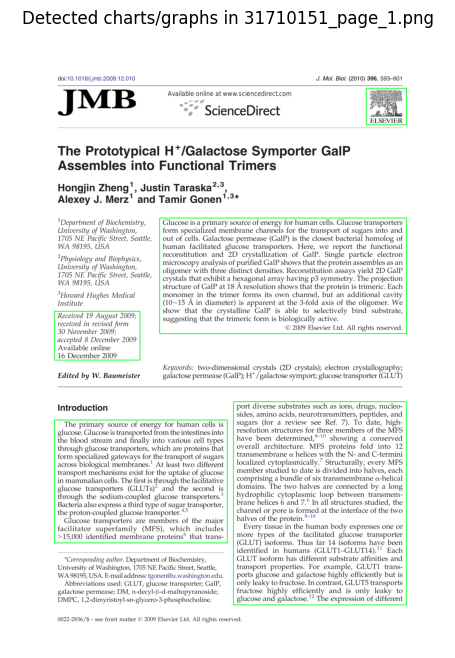

Processing 31710151_page_3.png...
Saved chart 1 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_0.png
Saved chart 2 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_1.png
Saved chart 3 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_2.png
Saved chart 4 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_3.png
Saved chart 5 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_4.png
Saved chart 6 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_5.png
Saved chart 7 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_6.png
Saved chart 8 from 31710151_page_3.png to /workspace/Documents/extracted_figures_3/31710151_page_3_chart_7.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31

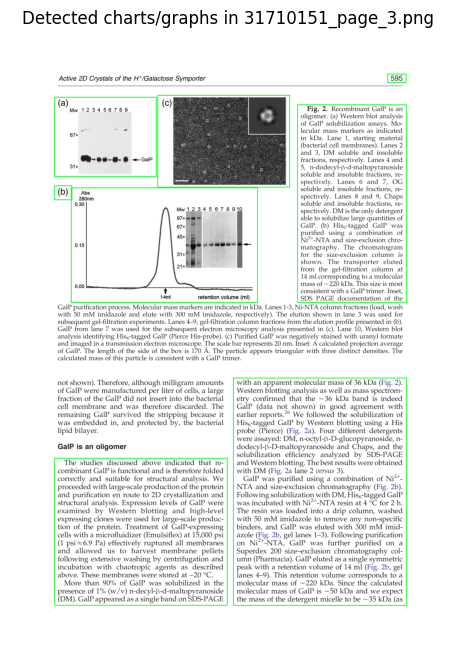

Processing 31710151_page_7.png...
Saved chart 1 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_0.png
Saved chart 2 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_1.png
Saved chart 3 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_2.png
Saved chart 4 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_3.png
Saved chart 5 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_4.png
Saved chart 6 from 31710151_page_7.png to /workspace/Documents/extracted_figures_3/31710151_page_7_chart_5.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_7.png


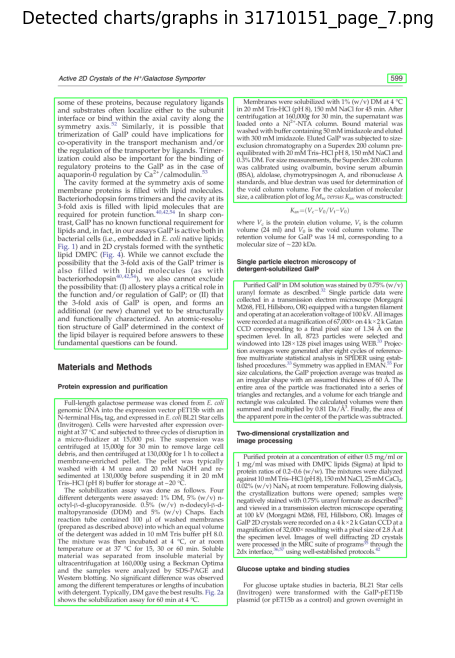

Processing 31710151_page_4.png...
Saved chart 1 from 31710151_page_4.png to /workspace/Documents/extracted_figures_3/31710151_page_4_chart_0.png
Saved chart 2 from 31710151_page_4.png to /workspace/Documents/extracted_figures_3/31710151_page_4_chart_1.png
Saved chart 3 from 31710151_page_4.png to /workspace/Documents/extracted_figures_3/31710151_page_4_chart_2.png
Saved chart 4 from 31710151_page_4.png to /workspace/Documents/extracted_figures_3/31710151_page_4_chart_3.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_31710151_page_4.png


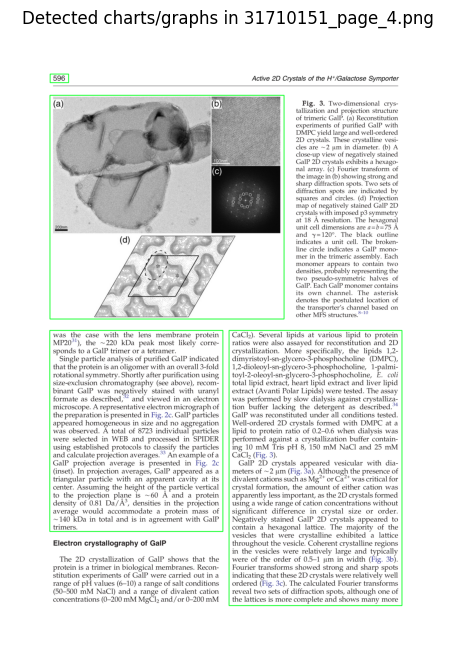

In [60]:
input_path = "/workspace/Documents/outputs" 
output_path = "/workspace/Documents/extracted_figures_3" 

#error handling
os.makedirs(output_path, exist_ok=True)

# Loop images
for img_path in Path(input_path).glob("*.png"):
    print(f"Processing {img_path.name}...")
    
    #load + enhance
    img = cv2.imread(str(img_path))
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.equalizeHist(gray)  #enhancing constrast for darker regions
    
    #instead of Otsu's using thresholding the image via adaptive method
    thresh = cv2.adaptiveThreshold(
        enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )
    
    # dilate to connect text contours into single contour
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 10))
    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
    #removing text-heavy regions
    text_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 15))
    text_dilate = cv2.dilate(thresh, text_kernel, iterations=1)
    cnts = cv2.findContours(text_dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        #removing long, thin text regions
        if w / h > 4 or h / w > 4:
            cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
    #detecting remaining contours and determine bounding boxes for each chart
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    chart_count = 0 
    
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        #filtering out non-diagram regions
        if area > 1000 and 0.5 < aspect_ratio < 2.5:
            #bounding box
            cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
            
            #extract ROI
            ROI = original[y:y+h, x:x+w]
            
            output_file = Path(output_path) / f"{img_path.stem}_chart_{chart_count}.png"
            cv2.imwrite(str(output_file), ROI)
            chart_count += 1
            print(f"Saved chart {chart_count} from {img_path.name} to {output_file}")
    
    if chart_count > 0:
        annotated_file = Path(output_path) / f"annotated_{img_path.stem}.png"
        cv2.imwrite(str(annotated_file), img)
        print(f"Annotated image saved as {annotated_file}")
        
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected charts/graphs in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No charts/graphs detected in {img_path.name}, skipping.")


Processing pdf_page_9.png...
Saved chart 1 from pdf_page_9.png to /workspace/Documents/extractions/pdf_page_9_chart_0.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_9.png


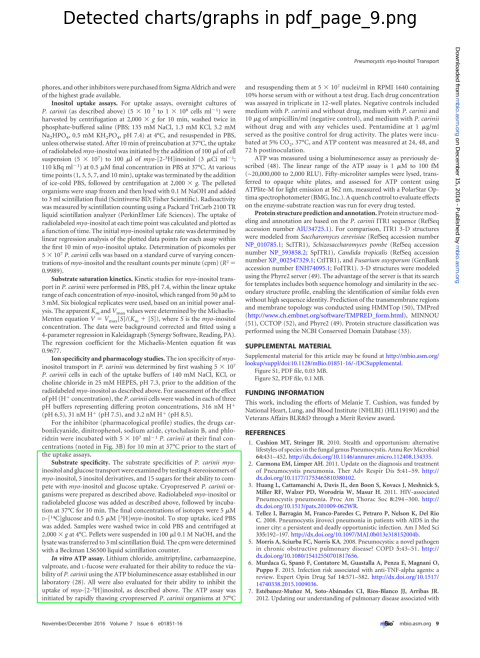

Processing pdf_page_2.png...
Saved chart 1 from pdf_page_2.png to /workspace/Documents/extractions/pdf_page_2_chart_0.png
Saved chart 2 from pdf_page_2.png to /workspace/Documents/extractions/pdf_page_2_chart_1.png
Saved chart 3 from pdf_page_2.png to /workspace/Documents/extractions/pdf_page_2_chart_2.png
Saved chart 4 from pdf_page_2.png to /workspace/Documents/extractions/pdf_page_2_chart_3.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_2.png


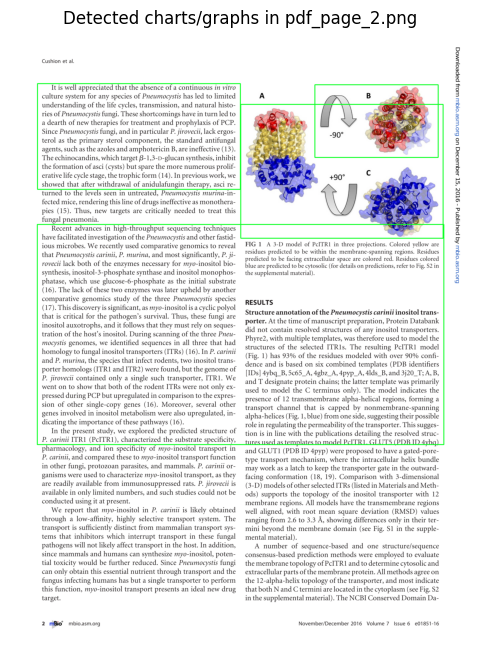

Processing pdf_page_11.png...
No charts/graphs detected in pdf_page_11.png, skipping.
Processing pdf_page_3.png...
Saved chart 1 from pdf_page_3.png to /workspace/Documents/extractions/pdf_page_3_chart_0.png
Saved chart 2 from pdf_page_3.png to /workspace/Documents/extractions/pdf_page_3_chart_1.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_3.png


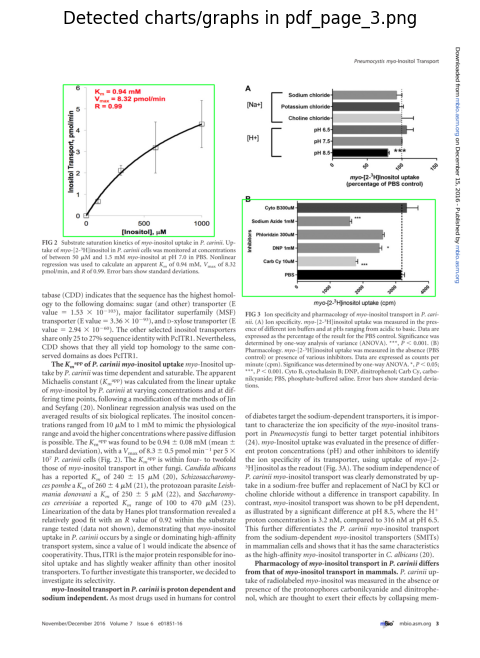

Processing pdf_page_6.png...
Saved chart 1 from pdf_page_6.png to /workspace/Documents/extractions/pdf_page_6_chart_0.png
Saved chart 2 from pdf_page_6.png to /workspace/Documents/extractions/pdf_page_6_chart_1.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_6.png


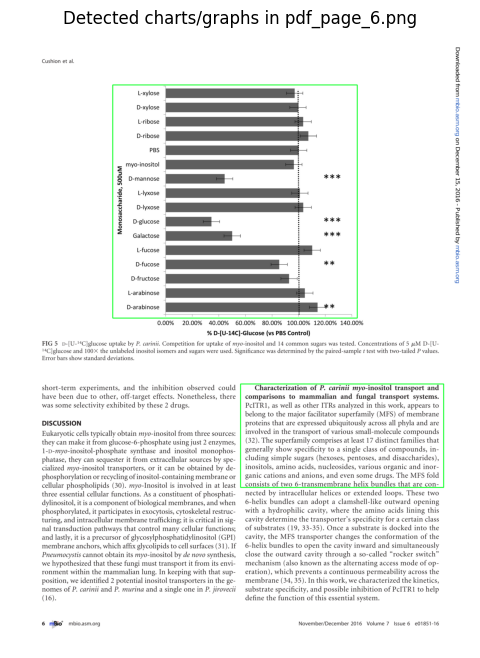

Processing pdf_page_7.png...
Saved chart 1 from pdf_page_7.png to /workspace/Documents/extractions/pdf_page_7_chart_0.png
Saved chart 2 from pdf_page_7.png to /workspace/Documents/extractions/pdf_page_7_chart_1.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_7.png


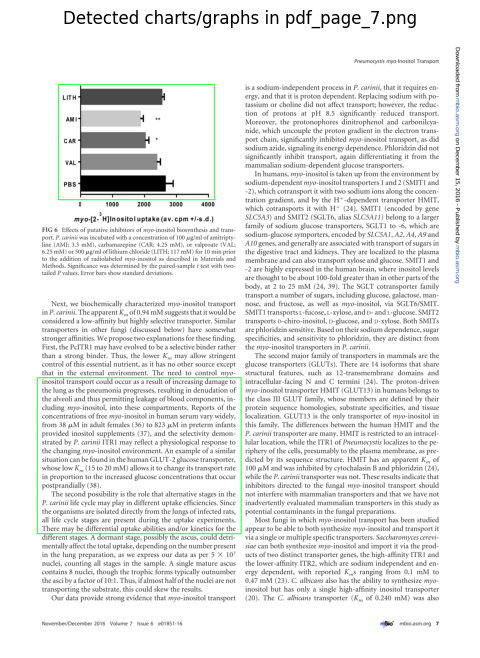

Processing pdf_page_5.png...
Saved chart 1 from pdf_page_5.png to /workspace/Documents/extractions/pdf_page_5_chart_0.png
Saved chart 2 from pdf_page_5.png to /workspace/Documents/extractions/pdf_page_5_chart_1.png
Saved chart 3 from pdf_page_5.png to /workspace/Documents/extractions/pdf_page_5_chart_2.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_5.png


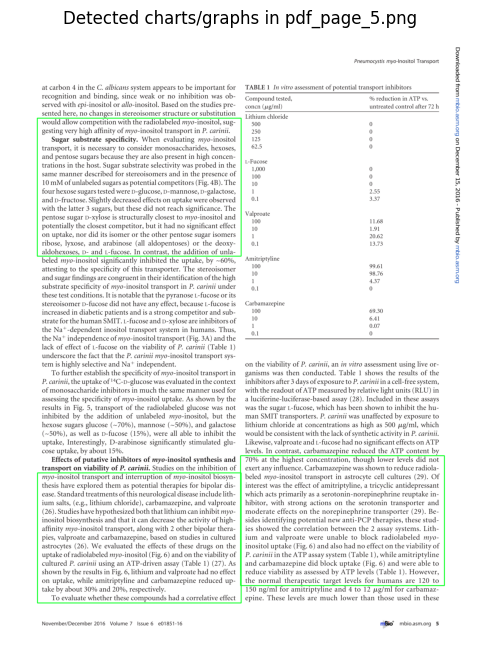

Processing pdf_page_8.png...
Saved chart 1 from pdf_page_8.png to /workspace/Documents/extractions/pdf_page_8_chart_0.png
Saved chart 2 from pdf_page_8.png to /workspace/Documents/extractions/pdf_page_8_chart_1.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_8.png


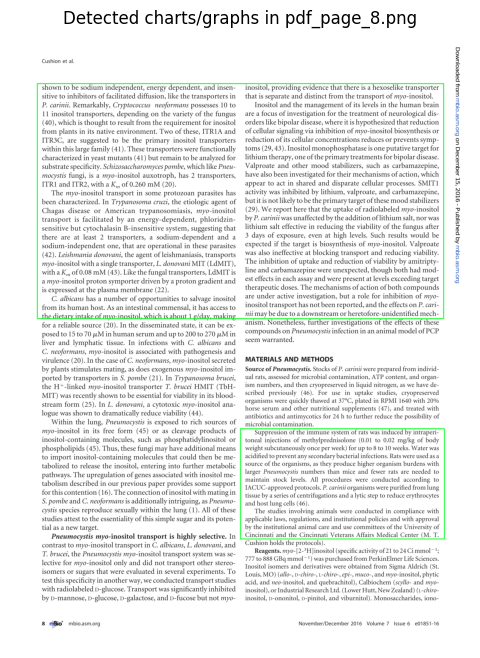

Processing pdf_page_10.png...
Saved chart 1 from pdf_page_10.png to /workspace/Documents/extractions/pdf_page_10_chart_0.png
Saved chart 2 from pdf_page_10.png to /workspace/Documents/extractions/pdf_page_10_chart_1.png
Saved chart 3 from pdf_page_10.png to /workspace/Documents/extractions/pdf_page_10_chart_2.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_10.png


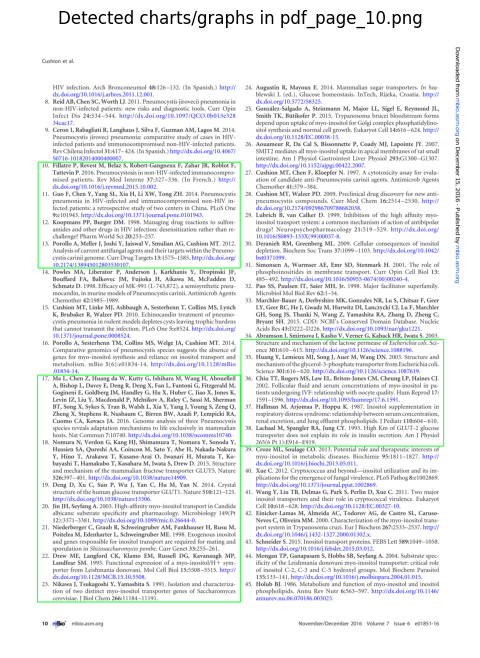

Processing pdf_page_4.png...
Saved chart 1 from pdf_page_4.png to /workspace/Documents/extractions/pdf_page_4_chart_0.png
Saved chart 2 from pdf_page_4.png to /workspace/Documents/extractions/pdf_page_4_chart_1.png
Saved chart 3 from pdf_page_4.png to /workspace/Documents/extractions/pdf_page_4_chart_2.png
Annotated image saved as /workspace/Documents/extractions/annotated_pdf_page_4.png


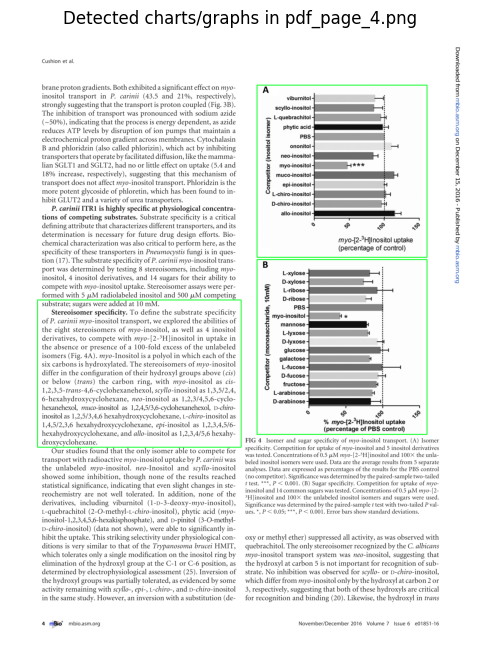

Processing pdf_page_1.png...
No charts/graphs detected in pdf_page_1.png, skipping.


In [166]:
# New Strategy - Most Accurate Pass
output_path = "/workspace/Documents/extractions" 

#Just change input path for each paper

#loop through images
for img_path in Path(input_path4).glob("*.png"):
    print(f"Processing {img_path.name}...")
    
    #load image + enhance contrast
    img = cv2.imread(str(img_path))
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.equalizeHist(gray)  # done for darker regions
    
    #threshold the image using adaptive method
    thresh = cv2.adaptiveThreshold(
        enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )
    
    #dilate to connect text contours into a single
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
    #find + remove text regions
    text_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 3))
    text_dilate = cv2.dilate(thresh, text_kernel, iterations=1)
    cnts = cv2.findContours(text_dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        # Remove long, thin text regions
        if aspect_ratio > 5 or aspect_ratio < 0.5:
            cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
    #detect contours left + bounding boxes
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    chart_count = 0  #counter used for multiple charts/graphs
    
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        #filter out non-diagram
        if area > 8000 and 0.8 < aspect_ratio < 2:
            # Draw bounding box on the original image
            cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
            
            #extract ROI
            ROI = original[y:y+h, x:x+w]
            
            #save
            output_file = Path(output_path) / f"{img_path.stem}_chart_{chart_count}.png"
            cv2.imwrite(str(output_file), ROI)
            chart_count += 1
            print(f"Saved chart {chart_count} from {img_path.name} to {output_file}")
    
    #save and display
    if chart_count > 0:
        annotated_file = Path(output_path) / f"annotated_{img_path.stem}.png"
        cv2.imwrite(str(annotated_file), img)
        print(f"Annotated image saved as {annotated_file}")
        
        # Display annotated image
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected charts/graphs in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No charts/graphs detected in {img_path.name}, skipping.")


In [86]:
Chart

In [86]:
# Now for ChartOCR Setup
# All instructions and precise error-handling is all accessable via
# GitHub README file

In [86]:
# Please first install Anaconda and create an Anaconda environment using the provided package list.

In [9]:
# Creating conda environment based on DeepRule.txt dependencies
# Make sure ALL links are updated to your python and cuda versions

# conda create --name DeepRule --file /workspace/Documents/DeepRule-master/DeepRule-master/DeepRule.txt -y





Preparing transaction: done
Verifying transaction: done
Executing transaction: / 

    Installed package of scikit-learn can be accelerated using scikit-learn-intelex.
    More details are available here: https://intel.github.io/scikit-learn-intelex

    For example:

        $ conda install scikit-learn-intelex
        $ python -m sklearnex my_application.py

    

done


In [12]:
# After you create the environment, activate it.
# conda activate DeepRule

# Current implementation only supports GPU so you need a GPU and need to have CUDA installed on your machine.


CommandNotFoundError: Your shell has not been properly configured to use 'conda activate'.
To initialize your shell, run

    $ conda init <SHELL_NAME>

Currently supported shells are:
  - bash
  - fish
  - tcsh
  - xonsh
  - zsh
  - powershell

See 'conda init --help' for more information and options.

IMPORTANT: You may need to close and restart your shell after running 'conda init'.




In [23]:
# Compiling Corner Pooling Layers
# You need to compile the C++ implementation of corner pooling layers. Please check the latest CornerNet on github if you find problems.

# This also requires a different CornerNet environment
# as to not have conflicting Python and CUDA versions

# cd /workspace/Documents/CornerNet-master/CornerNet-master/models/py_utils/_cpools/
# python setup.py build_ext --inplace

/workspace/Documents/CornerNet-master/CornerNet-master/models/py_utils/_cpools


In [ ]:
# Compiling NMS
# You also need to compile the NMS code (originally from Faster R-CNN and Soft-NMS).

# cd <CornerNet dir>/external
# make

In [ ]:
# Installing MS COCO APIs
# You also need to install the MS COCO APIs.

# pip install pycocotools

In [ ]:
# Downloading CHARTEX Data
# https://huggingface.co/datasets/asbljy/DeepRuleDataset/tree/main
# Unzip the file to the data path

# Data Description (Updated on 11/21/2021)
# For Pie data
# {"image_id": 74999, "category_id": 0, "bbox": [135.0, 60.0, 132.0, 60.0, 134.0, 130.0], "area": 105.02630551355209, "id": 433872}
# The meaning of the bbox is [center_x, center_y, edge_1_x, edge_1_y, edge_2_x, edge_2_y]
# It’s the three critical points for a sector of the pie graph.

# For the line data
# {"image_id": 120596, "category_id": 0, "bbox": [137.0, 131.0, 174.0, 113.0, 210.0, 80.0, 247.0, 85.0], "area": 0, "id": 288282}
# The meaning of the bbox is [d_1_x, d_1_y, …., d_n_x,d_n_y]
# It’s the data points for a line in the image with image_id.
# instancesLineClsEx is used for training the LineCls.

# For the Bar data
# Just the bounding box of the bars.

# For the cls data
# Just the bounding box.
# But different category_id refers to different components like the draw area, title and legends.

In [ ]:
# Training and Evaluation
# To train and evaluate a network, you will need to create a configuration file, which defines the hyperparameters, and a model file, which defines the network architecture. The configuration file should be in JSON format and placed in config/. Each configuration file should have a corresponding model file in models/. i.e. If there is a <model>.json in config/, there should be a <model>.py in models/. There is only one exception which we will mention later. The cfg file names of our proposed modules are as follows:

# Bar: CornerNetPureBar

# Pie: CornerNetPurePie

# Line: CornerNetLine

# Query: CornerNetLineClsReal

# Cls: CornerNetCls

# To train a model:

# python train.py --cfg_file <model> --data_dir <data path> 
# e.g. 
# python train_chart.py --cfg_file CornerNetBar --data_dir /home/data/bardata(1031)

# To use the trained model as a web server pipeline:

# python manage.py runserver 8800

# Access localhost:8800 to interact.